<a href="https://colab.research.google.com/github/Navneet035/Navneet035/blob/main/code/chapter-4/1-feature-extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<table class="tfo-notebook-buttons" align="center">
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/practicaldl/Practical-Deep-Learning-Book/blob/master/code/chapter-4/1-feature-extraction.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/practicaldl/Practical-Deep-Learning-Book/blob/master/code/chapter-4/1-feature-extraction.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
  </td>
</table>


This code is part of [Chapter 4 - Building a Reverse Image Search Engine: Understanding Embeddings](https://learning.oreilly.com/library/view/practical-deep-learning/9781492034858/ch04.html).

Note: In order to run this notebook on Google Colab you need to [follow these instructions](https://colab.research.google.com/github/googlecolab/colabtools/blob/master/notebooks/colab-github-demo.ipynb#scrollTo=WzIRIt9d2huC) so that the local data such as the images are available in your Google Drive.

# Feature Extraction

This notebook is the first among six of the follow along Jupyter Notebook for Chapter 4. We will extract features from pretrained models like VGG-16, VGG-19, ResNet-50, InceptionV3 and MobileNet and benchmark them using the Caltech101 dataset.

## Dataset:

In the `data` directory of the repo, download the Caltech101 dataset (or try it on your dataset). Please note (as of 01 September 2020) the Caltech 101 dataset has moved locations and now has to be downloaded through Google Drive using `gdown`.

```
$ gdown https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp --output caltech101.tar.gz

$ tar -xvzf caltech101.tar.gz

$ mv 101_ObjectCategories datasets/caltech101
```
Note that there is a 102nd category called ‘BACKGROUND_Google’ consisting of random images not contained in the first 101 categories, which needs to be deleted before we start experimenting. 

```
$ rm -rf datasets/caltech101/BACKGROUND_Google
```

In [1]:
!mkdir -p ../../datasets
!pip install gdown
!gdown https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp --output ../../datasets/caltech101.tar.gz
!tar -xvzf ../../datasets/caltech101.tar.gz --directory ../../datasets
!mv ../../datasets/101_ObjectCategories ../../datasets/caltech101
!rm -rf ../../datasets/caltech101/BACKGROUND_Google

Streaming output truncated to the last 5000 lines.
101_ObjectCategories/chair/image_0005.jpg
101_ObjectCategories/chair/image_0006.jpg
101_ObjectCategories/chair/image_0007.jpg
101_ObjectCategories/chair/image_0008.jpg
101_ObjectCategories/chair/image_0010.jpg
101_ObjectCategories/chair/image_0011.jpg
101_ObjectCategories/chair/image_0012.jpg
101_ObjectCategories/chair/image_0013.jpg
101_ObjectCategories/chair/image_0014.jpg
101_ObjectCategories/chair/image_0016.jpg
101_ObjectCategories/chair/image_0017.jpg
101_ObjectCategories/chair/image_0018.jpg
101_ObjectCategories/chair/image_0019.jpg
101_ObjectCategories/chair/image_0020.jpg
101_ObjectCategories/chair/image_0022.jpg
101_ObjectCategories/chair/image_0023.jpg
101_ObjectCategories/chair/image_0024.jpg
101_ObjectCategories/chair/image_0025.jpg
101_ObjectCategories/chair/image_0026.jpg
101_ObjectCategories/chair/image_0028.jpg
101_ObjectCategories/chair/image_0029.jpg
101_ObjectCategories/chair/image_0030.jpg
101_ObjectCategories/chai

In [2]:
import numpy as np
from numpy.linalg import norm
import pickle
from tqdm import tqdm, tqdm_notebook
import os
import random
import time
import math
import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout, GlobalAveragePooling2D


We will define a helper function that allows us to choose any pretrained model with all the necessary details for our experiments.

In [3]:
def model_picker(name):
    if (name == 'vgg16'):
        model = VGG16(weights='imagenet',
                      include_top=False,
                      input_shape=(224, 224, 3),
                      pooling='max')
    elif (name == 'vgg19'):
        model = VGG19(weights='imagenet',
                      include_top=False,
                      input_shape=(224, 224, 3),
                      pooling='max')
    elif (name == 'mobilenet'):
        model = MobileNet(weights='imagenet',
                          include_top=False,
                          input_shape=(224, 224, 3),
                          pooling='max',
                          depth_multiplier=1,
                          alpha=1)
    elif (name == 'inception'):
        model = InceptionV3(weights='imagenet',
                            include_top=False,
                            input_shape=(224, 224, 3),
                            pooling='max')
    elif (name == 'resnet'):
        model = ResNet50(weights='imagenet',
                         include_top=False,
                         input_shape=(224, 224, 3),
                        pooling='max')
    elif (name == 'xception'):
        model = Xception(weights='imagenet',
                         include_top=False,
                         input_shape=(224, 224, 3),
                         pooling='max')
    else:
        print("Specified model not available")
    return model

Now, let's put our function to use.

In [4]:
model_architecture = 'resnet'
model = model_picker(model_architecture)

94773248/94765736 [==============================] - 1s 0us/step


Let's define a function to extract image features given an image and a model. We developed a similar function in Chapter-2

In [5]:
def extract_features(img_path, model):
    input_shape = (224, 224, 3)
    img = image.load_img(img_path,
                         target_size=(input_shape[0], input_shape[1]))
    img_array = image.img_to_array(img)
    expanded_img_array = np.expand_dims(img_array, axis=0)
    preprocessed_img = preprocess_input(expanded_img_array)
    features = model.predict(preprocessed_img)
    flattened_features = features.flatten()
    normalized_features = flattened_features / norm(flattened_features)
    return normalized_features

Let's see the feature length the model generates. 

In [6]:
features = extract_features('../../sample-images/cat.jpg', model)
print(len(features))

FileNotFoundError: ignored

Now, we will see how much time it takes to extract features of one image.

In [ ]:
%timeit features = extract_features('../../sample-images/cat.jpg', model)

The time taken to extract features is dependent on a few factors such as image size, computing power etc. A better benchmark would be running the network over an entire dataset. A simple change to the existing code will allow this.

Let's make a handy function to recursively get all the image files under a root directory.

In [7]:
extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG']

def get_file_list(root_dir):
    file_list = []
    for root, directories, filenames in os.walk(root_dir):
        for filename in filenames:
            if any(ext in filename for ext in extensions):
                file_list.append(os.path.join(root, filename))
    return file_list

Now, let's run the extraction over the entire dataset and time it.

In [8]:
# path to the your datasets
root_dir = '../../datasets/caltech101'
filenames = sorted(get_file_list(root_dir))

feature_list = []
for i in tqdm_notebook(range(len(filenames))):
    feature_list.append(extract_features(filenames[i], model))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


Now let's try the same with the Keras Image Generator functions.

In [9]:
batch_size = 64
datagen = tensorflow.keras.preprocessing.image.ImageDataGenerator(preprocessing_function=preprocess_input)

generator = datagen.flow_from_directory(root_dir,
                                        target_size=(224, 224),
                                        batch_size=batch_size,
                                        class_mode=None,
                                        shuffle=False)

num_images = len(generator.filenames)
num_epochs = int(math.ceil(num_images / batch_size))

start_time = time.time()
feature_list = []
feature_list = model.predict_generator(generator, num_epochs)
end_time = time.time()

Found 8677 images belonging to 101 classes.


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2001: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


In [10]:
for i, features in enumerate(feature_list):
    feature_list[i] = features / norm(features)

feature_list = feature_list.reshape(num_images, -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

Num images   =  8677
Shape of feature_list =  (8677, 2048)
Time taken in sec =  31.86353349685669


### GPU Utilization's effect on time taken by varying batch size 


GPUs are optimized to parallelize the feature generation process and hence will give better results when multiple images are passed instead of just one image.
The opportunity to improve can be seen based on GPU Utilization. Low GPU Utilization indicates an opportunity to further improve the througput.


GPU Utilization can be seen using the nvidia-smi command. To update it every half a second

    watch -n .5 nvidia-smi
    
To pool the GPU utilization every second and dump into a file

    nvidia-smi --query-gpu=utilization.gpu --format=csv,noheader,nounits -f gpu_utilization.csv -l 1
    
To calculate median GPU Utilization from the file generated

    sort -n gpu_utilization.csv | datamash median 1

|Model |Time second (sec) | batch_size | % GPU Utilization | Implementation|
|-|-|-|
|Resnet50 | 124  | 1  | 52 | extract_features    |
|Resnet50 | 98   | 1  | 72 | ImageDataGenerator |
|Resnet50 | 57   | 2  | 81 | ImageDataGenerator |
|Resnet50 | 40   | 4  | 88 | ImageDataGenerator |
|Resnet50 | 34   | 8  | 94 | ImageDataGenerator |
|Resnet50 | 29   | 16 | 97 | ImageDataGenerator |
|Resnet50 | 28   | 32 | 97 | ImageDataGenerator |
|Resnet50 | 28   | 64 | 98 | ImageDataGenerator |

### Some benchmarks on different model architectures to see relative speeds

Keeping batch size of 64, benchmarking the different models

|Model |items/second |
|-|-|-|
| VGG19     | 31.06 |
| VGG16     | 28.16 | 
| Resnet50  | 28.48 | 
| Inception | 20.07 |
| Mobilenet | 13.45 |

Let's save the features as intermediate files to use later.

In [11]:
filenames = [root_dir + '/' + s for s in generator.filenames]

In [14]:
pickle.dump(generator.classes, open('/content/class_ids-caltech101.pickle',
                                    'wb'))
pickle.dump(filenames, open('/content/filenames-caltech101.pickle', 'wb'))
pickle.dump(
    feature_list,
    open('/content/features-caltech101-' + model_architecture + '.pickle', 'wb'))

Let's train a finetuned model as well and save the features for that as well.

In [15]:
TRAIN_SAMPLES = 8677
NUM_CLASSES = 101
IMG_WIDTH, IMG_HEIGHT = 224, 224

In [16]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=20,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   zoom_range=0.2)

In [17]:
train_generator = train_datagen.flow_from_directory(root_dir,
                                                    target_size=(IMG_WIDTH,
                                                                 IMG_HEIGHT),
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=12345,
                                                    class_mode='categorical')

Found 8677 images belonging to 101 classes.


In [18]:
def model_maker():
    base_model = ResNet50(include_top=False,
                           input_shape=(IMG_WIDTH, IMG_HEIGHT, 3))
    for layer in base_model.layers[:]:
        layer.trainable = False
    input = Input(shape=(IMG_WIDTH, IMG_HEIGHT, 3))
    custom_model = base_model(input)
    custom_model = GlobalAveragePooling2D()(custom_model)
    custom_model = Dense(64, activation='relu')(custom_model)
    custom_model = Dropout(0.5)(custom_model)
    predictions = Dense(NUM_CLASSES, activation='softmax')(custom_model)
    return Model(inputs=input, outputs=predictions)

In [19]:
model_finetuned = model_maker()
model_finetuned.compile(loss='categorical_crossentropy',
              optimizer=tensorflow.keras.optimizers.Adam(0.001),
              metrics=['acc'])
model_finetuned.fit_generator(
    train_generator,
    steps_per_epoch=math.ceil(float(TRAIN_SAMPLES) / batch_size),
    epochs=10)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
136/136 [==============================] - 105s 754ms/step - loss: 3.0517 - acc: 0.3331
Epoch 2/10
136/136 [==============================] - 103s 755ms/step - loss: 1.8974 - acc: 0.5396
Epoch 3/10
136/136 [==============================] - 102s 753ms/step - loss: 1.4354 - acc: 0.6267
Epoch 4/10
136/136 [==============================] - 103s 755ms/step - loss: 1.2075 - acc: 0.6718
Epoch 5/10
136/136 [==============================] - 102s 750ms/step - loss: 1.0520 - acc: 0.7104
Epoch 6/10
136/136 [==============================] - 102s 751ms/step - loss: 0.9547 - acc: 0.7302
Epoch 7/10
136/136 [==============================] - 102s 753ms/step - loss: 0.8822 - acc: 0.7435
Epoch 8/10
136/136 [==============================] - 102s 750ms/step - loss: 0.8467 - acc: 0.7519
Epoch 9/10
136/136 [==============================] - 102s 749ms/step - loss: 0.7831 - acc: 0.7722
Epoch 10/10
136/136 [==============================] - 102s 751ms/step - loss: 0.7657 - acc: 0.7731


In [25]:
model_finetuned.save('/home/model-finetuned.h5')

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [21]:
start_time = time.time()
feature_list_finetuned = []
feature_list_finetuned = model_finetuned.predict_generator(generator, num_epochs)
end_time = time.time()

for i, features_finetuned in enumerate(feature_list_finetuned):
    feature_list_finetuned[i] = features_finetuned / norm(features_finetuned)

feature_list = feature_list_finetuned.reshape(num_images, -1)

print("Num images   = ", len(generator.classes))
print("Shape of feature_list = ", feature_list.shape)
print("Time taken in sec = ", end_time - start_time)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2001: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Num images   =  8677
Shape of feature_list =  (8677, 101)
Time taken in sec =  28.955296754837036


In [24]:
pickle.dump(
    feature_list,
    open('/home/features-caltech101-resnet-finetuned.pickle', 'wb'))

In [ ]:
##FEATURE EXTRACTION 2 

In [26]:
import numpy as np
import pickle
from tqdm import tqdm, tqdm_notebook
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

In [30]:
filenames = pickle.load(open('/content/filenames-caltech101.pickle', 'rb'))
feature_list = pickle.load(open('/content/features-caltech101-resnet.pickle',
                                'rb'))
class_ids = pickle.load(open('/content/class_ids-caltech101.pickle', 'rb'))

In [31]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  8677
Number of features per image =  2048


In [32]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

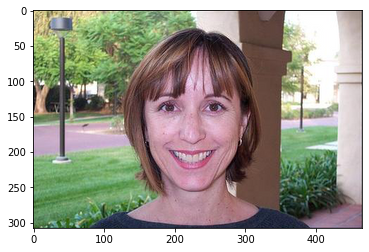

In [33]:
random_index = 75
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

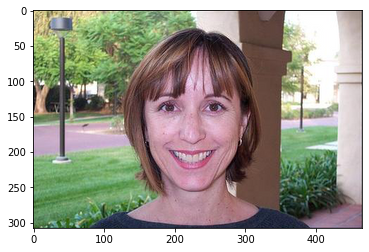

In [34]:
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos')

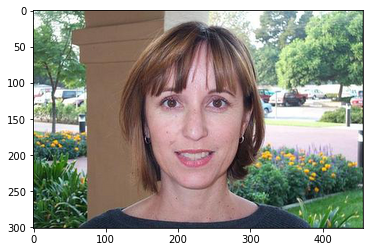

In [35]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos')

In [36]:
for i in range(5):
    print(distances[0][i])

2.1073424e-08
0.51936096
0.53159654
0.5465547
0.58122253


In [37]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]


# Helper function to get the classname and filename
def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]


# Helper functions to plot the nearest images given a query image
def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20, 10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title("Query Image\n" + classname_filename(filenames[i]))
        else:
            ax.set_title("Similar Image\n" + classname_filename(filenames[i]) +
                         "\nDistance: " +
                         str(float("{0:.2f}".format(distances[i]))))
        plt.imshow(image)
        # To save the plot in a high definition format i.e. PDF, uncomment the following line:
        #plt.savefig('results/' + str(random.randint(0,10000))+'.pdf', format='pdf', dpi=1000)
        # We will use this line repeatedly in our code.

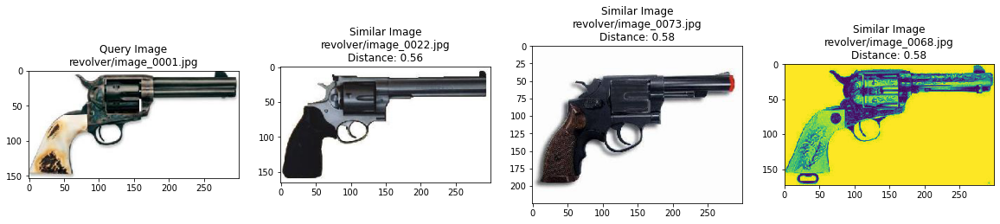

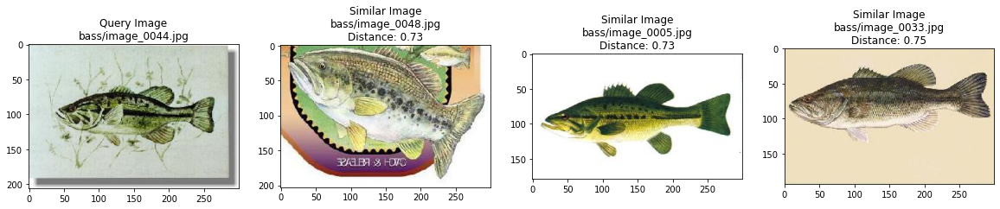

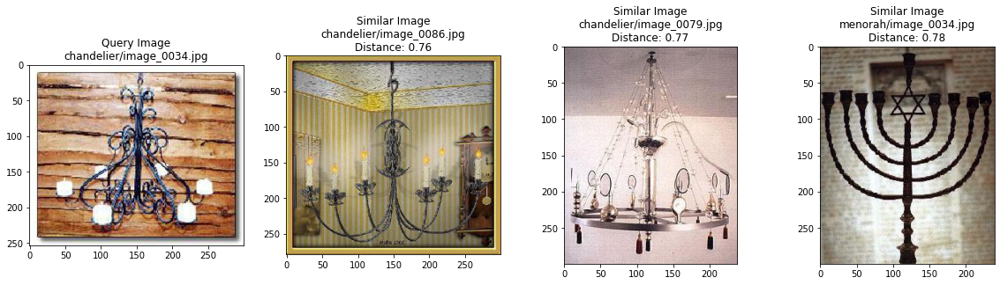

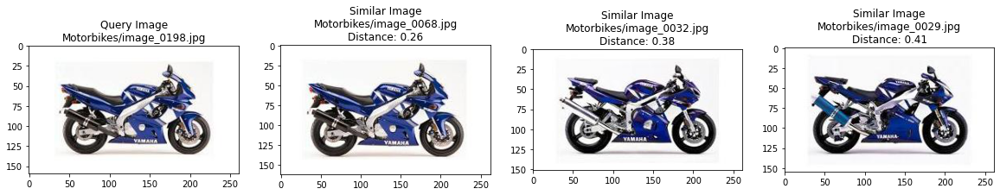

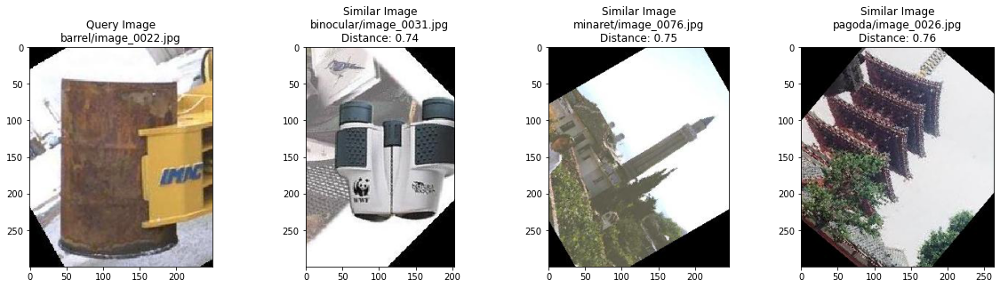

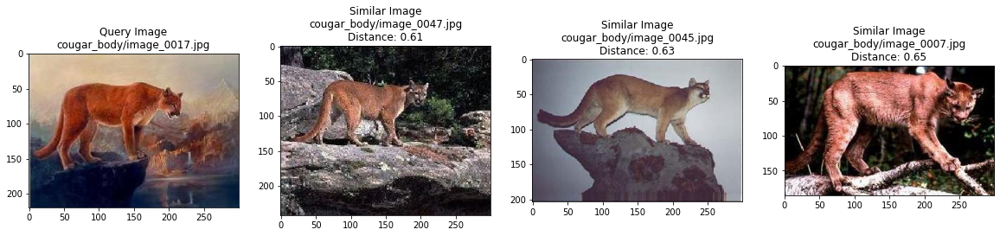

In [38]:
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [39]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ",
      np.median(distances[:, 2]))

Median distance between all photos:  1.0041636
Max distance between all photos:  1.2522098
Median distance among most similar photos:  0.65938926


In [40]:
selected_features = feature_list[:]
selected_class_ids = class_ids[:]
selected_filenames = filenames[:]

In [41]:
from sklearn.manifold import TSNE

# You can play with these values and see how the results change
n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8677 samples in 2.799s...
[t-SNE] Computed neighbors for 8677 samples in 324.691s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8677
[t-SNE] Computed conditional probabilities for sample 2000 / 8677
[t-SNE] Computed conditional probabilities for sample 3000 / 8677
[t-SNE] Computed conditional probabilities for sample 4000 / 8677
[t-SNE] Computed conditional probabilities for sample 5000 / 8677
[t-SNE] Computed conditional probabilities for sample 6000 / 8677
[t-SNE] Computed conditional probabilities for sample 7000 / 8677
[t-SNE] Computed conditional probabilities for sample 8000 / 8677
[t-SNE] Computed conditional probabilities for sample 8677 / 8677
[t-SNE] Mean sigma: 0.196518
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.436554
[t-SNE] KL divergence after 1000 iterations: 1.298294
t-SNE done! Time elapsed: 379.1992132663727 seconds


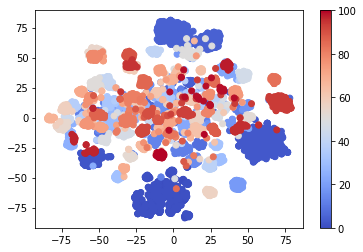

In [42]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()
# To save the plot in a high definition format i.e. PDF, uncomment the following line:
#plt.savefig('results/' + str(ADD_NAME_HERE)+'.pdf', format='pdf', dpi=1000)

In [45]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [46]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

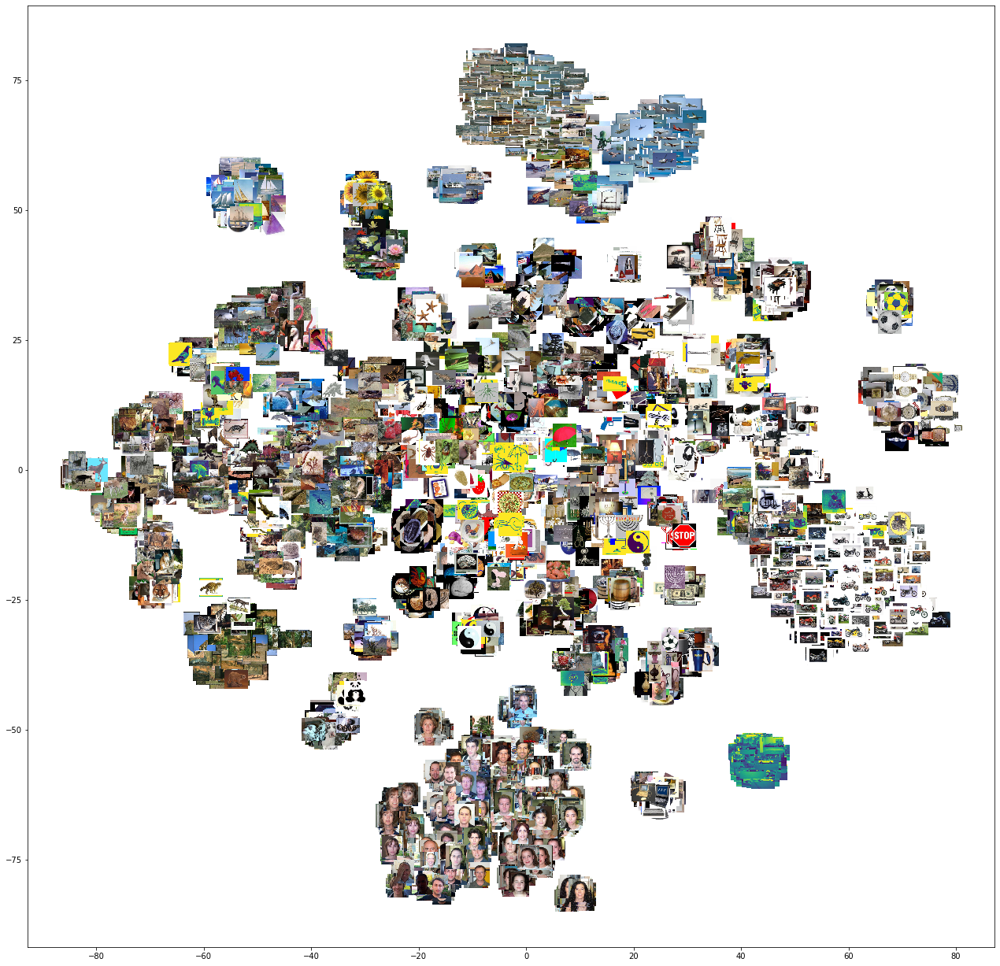

In [47]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

In [48]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

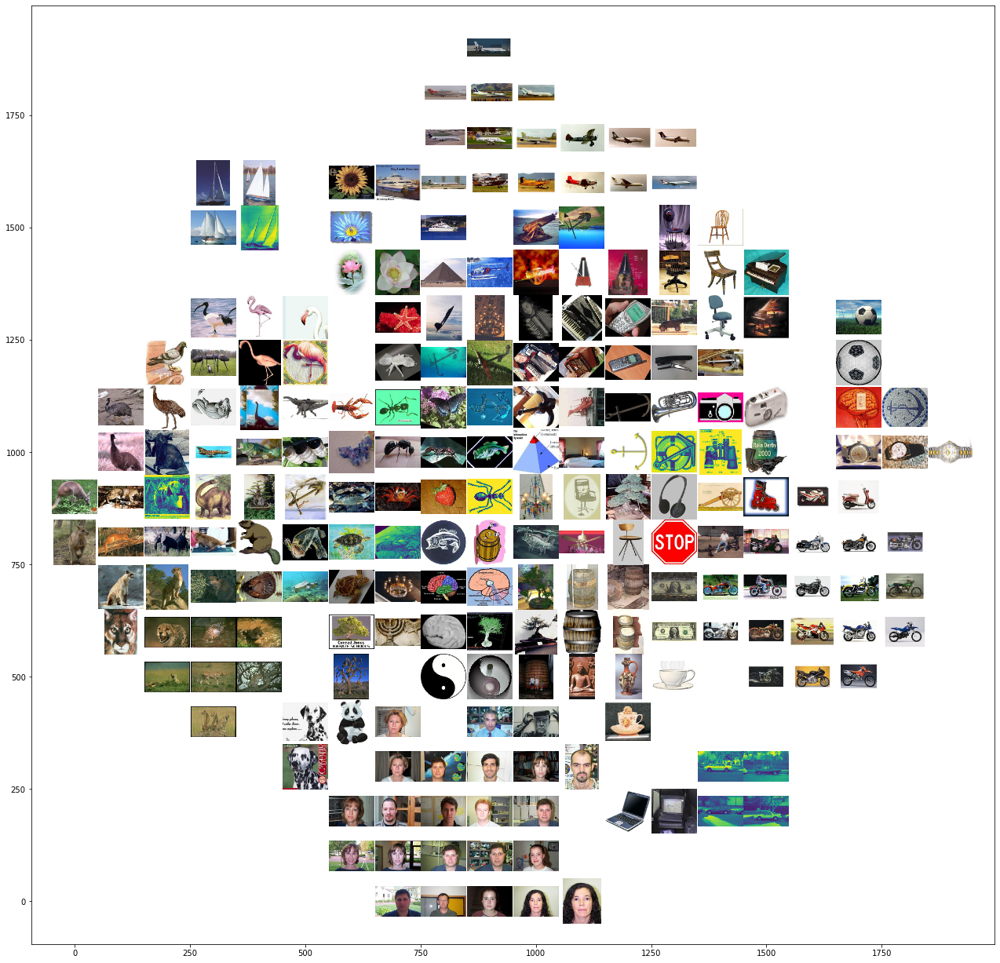

In [49]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

In [50]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [51]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

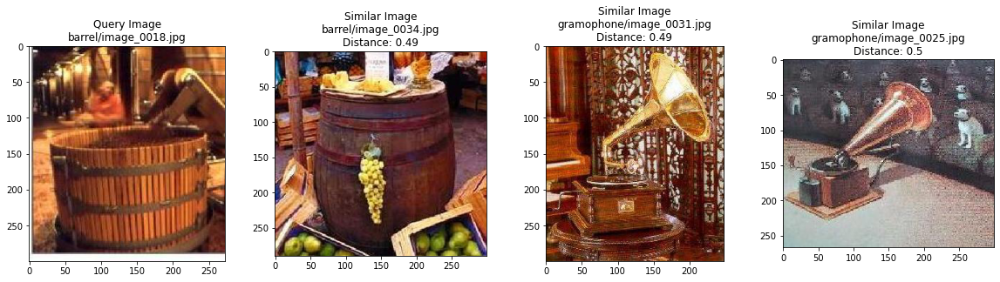

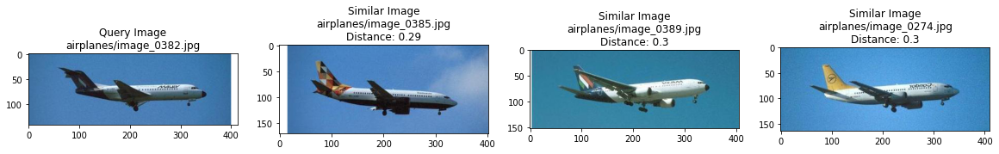

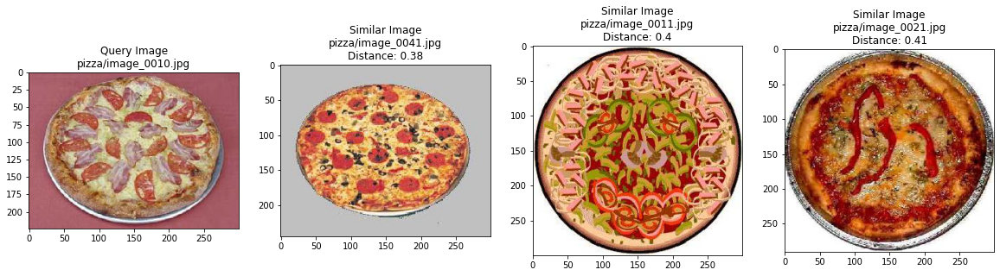

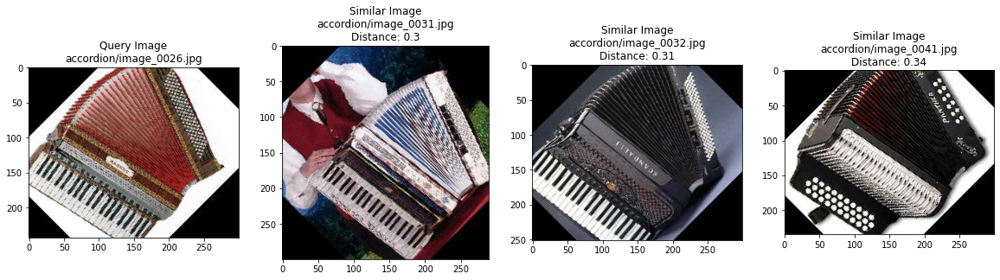

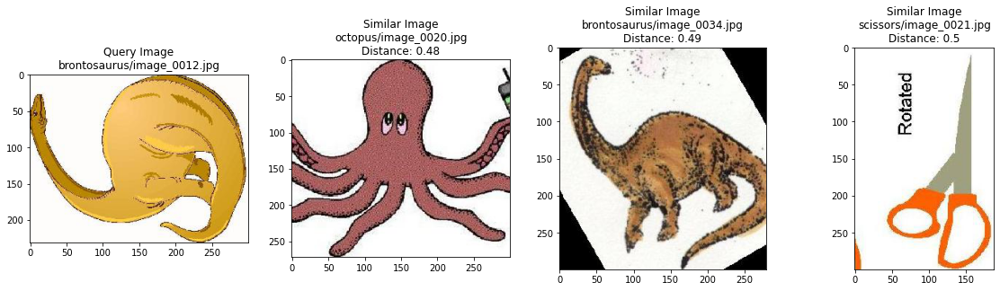

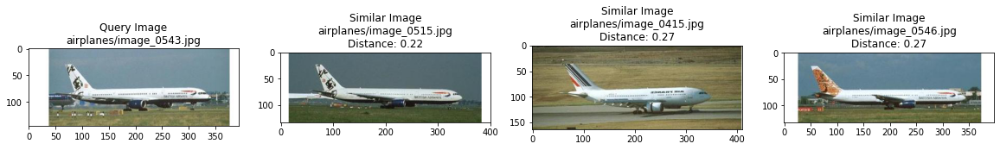

In [52]:
for i in range(6):
    random_image_index = random.randint(0, num_images)
    distances, indices = neighbors.kneighbors(
        [feature_list_compressed[random_image_index]])
    # Don't take the first closest image as it will be the same image
    similar_image_paths = [filenames[random_image_index]] + \
        [filenames[indices[0][i]] for i in range(1, 4)]
    plot_images(similar_image_paths, distances[0])

In [53]:
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.046s...
[t-SNE] Computed neighbors for 4000 samples in 2.391s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.143721
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.903152
[t-SNE] KL divergence after 1000 iterations: 1.097336
t-SNE done! Time elapsed: 24.607672214508057 seconds


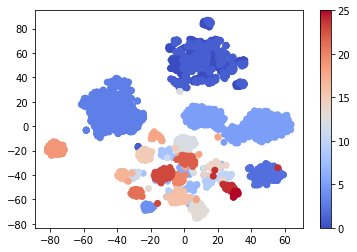

In [54]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

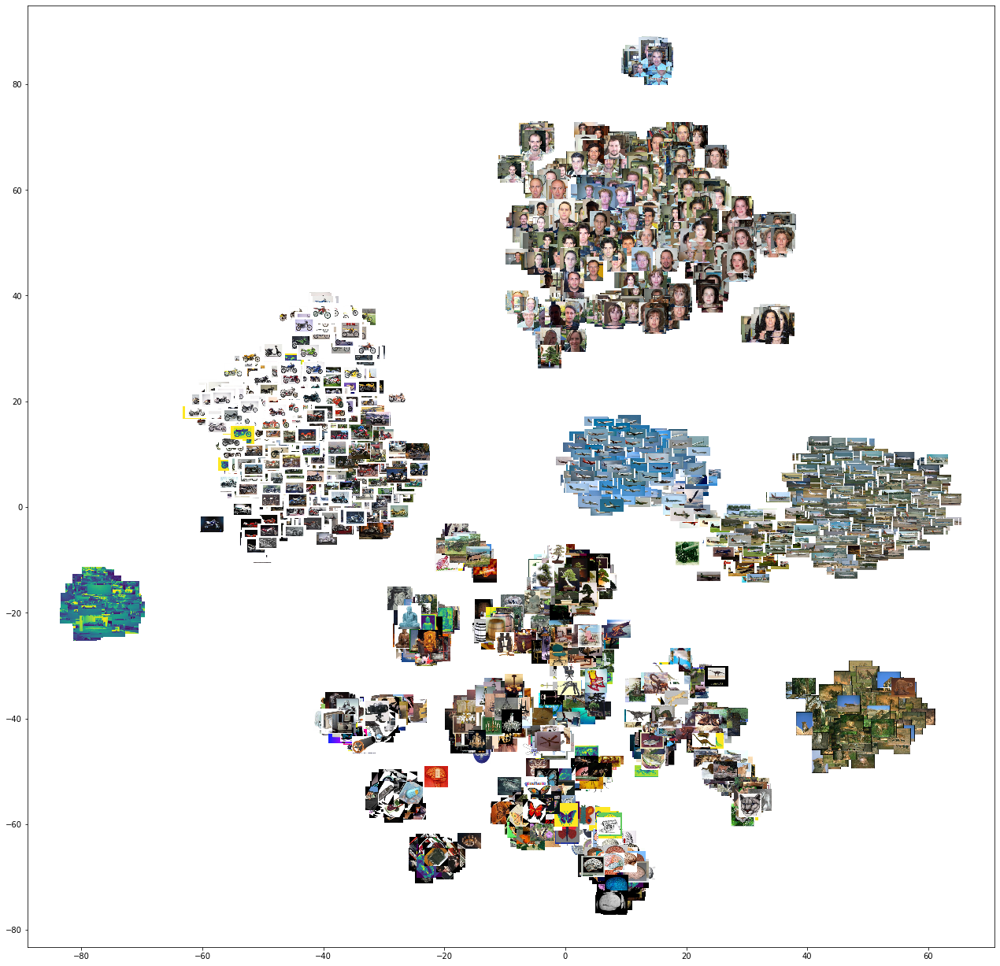

In [55]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

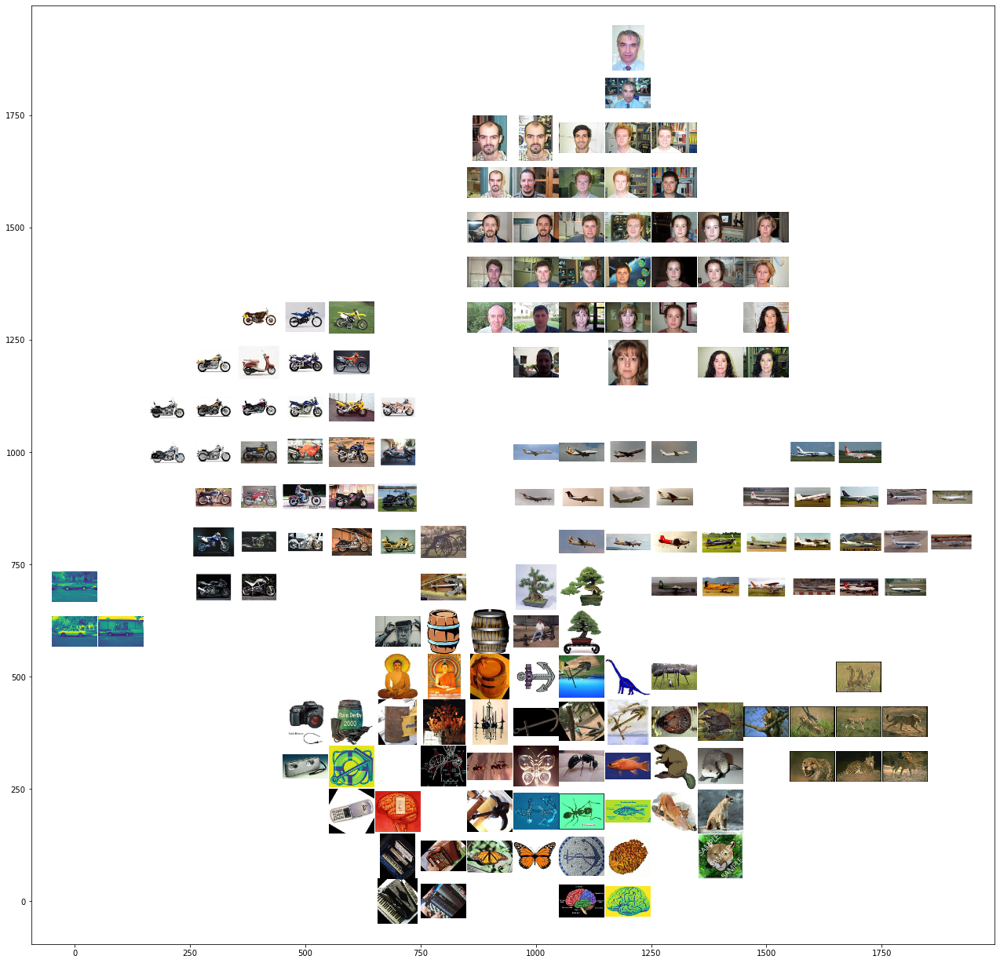

In [56]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)

In [ ]:
## Feature Extraction 3

In [57]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print("Number of images = ", num_images)
print("Number of features per image = ", num_features_per_image)

Number of images =  8677
Number of features per image =  2048


In [58]:
random_image_index = random.randint(0, num_images)

In [ ]:
Standard features + Brute Force Algorithm on one image
We will be timing the indexing for various Nearest Neighbors algorithms, so let's start with timing the indexing for the Brute force algorithm. While running terminal commands in iPython like the timeit command, the variables are not stored in memory, so we need to rerun the same command to compute and store the results in the variable.

In [59]:
%timeit NearestNeighbors(n_neighbors=5, algorithm='brute', metric='euclidean').fit(feature_list)
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

100 loops, best of 5: 13.6 ms per loop


In [60]:
%timeit neighbors.kneighbors([feature_list[random_image_index]])

10 loops, best of 5: 62.1 ms per loop


In [ ]:
##Feature Extraction level-3 

In [ ]:
##Improving accuracy with fine-tuning

In [61]:
import numpy as np
import pickle
from tqdm import tqdm, tqdm_notebook
import random
import time
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import PIL
from PIL import Image
from sklearn.neighbors import NearestNeighbors
import random
from textwrap import wrap

import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [62]:
# Helper function to get the classname
def classname(str):
    return str.split('/')[-2]

In [63]:
#Helper function to display accuracy stats and plot similar images
def display(dic, per_class, neighbors, message):
    for key in dic:
        print(key, "\tAccuracy: ", per_class[key])
    for each_class in dic:
        indices_of_class = [
            i for i, j in enumerate(filenames) if classname(j) == each_class
        ]
        random_image_index = random.choice(indices_of_class)
        distances, indices = neighbors.kneighbors(
            [feature_list[random_image_index]])
        similar_image_paths = [filenames[random_image_index]] + \
            [filenames[indices[0][i]] for i in range(1, 4)]
        plot_images(similar_image_paths, distances[0], message)

In [64]:
#Helper function that calculates accuracy using the Nearest Neighbours Brute force algorithm and returns the classes that the model performed least accurately on
def get_least_accurate_classes(feature_list):
    per_class_acc = {}
    num_nearest_neighbors = 5
    num_correct_predictions = 0
    num_incorrect_predictions = 0
    neighbors = NearestNeighbors(n_neighbors=num_nearest_neighbors,
                                 algorithm='brute',
                                 metric='euclidean').fit(feature_list)
    for i in tqdm_notebook(range(len(feature_list))):
        distances, indices = neighbors.kneighbors([feature_list[i]])
        for j in range(1, num_nearest_neighbors):
            predicted_class = classname(filenames[indices[0][j]])
            ground_truth = classname(filenames[i])
            if (predicted_class not in per_class_acc):
                per_class_acc[predicted_class] = [0, 0, 0]
            if ground_truth == predicted_class:
                num_correct_predictions += 1
                per_class_acc[predicted_class][0] += 1
                per_class_acc[predicted_class][2] += 1
            else:
                num_incorrect_predictions += 1
                per_class_acc[predicted_class][1] += 1
                per_class_acc[predicted_class][2] += 1
    print(
        "Accuracy is ",
        round(
            100.0 * num_correct_predictions /
            (1.0 * num_correct_predictions + num_incorrect_predictions), 2))
    for key, value in per_class_acc.items():
        per_class_acc[key] = round(100.0 * value[0] / (1.0 * value[2]), 2)
    dic = sorted(per_class_acc, key=per_class_acc.get)

    # least_accurate classes
    print("\n\nTop 10 incorrect classifications\n")
    for key in dic[:10]:
        print(key, "\tAccuracy: ", per_class_acc[key])
    return dic[:6], per_class_acc

In [65]:
#-------------Train the PCA model on the loaded features-----#


# Perform PCA over the features
# set the number of features intended
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list = pca.transform(feature_list)

In [66]:
#Note: We are using the classes with the least accuracy because the effect of finetuning is expected be most pronounced on these categories.
names_of_least_accurate_classes_before_finetuning, accuracy_per_class_before_finetuning = get_least_accurate_classes(
    feature_list[:])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  # Remove the CWD from sys.path while we load stuff.



Accuracy is  88.48


Top 10 incorrect classifications

lobster 	Accuracy:  47.78
crocodile 	Accuracy:  49.06
water_lilly 	Accuracy:  49.44
anchor 	Accuracy:  51.41
octopus 	Accuracy:  57.45
bass 	Accuracy:  58.46
crocodile_head 	Accuracy:  58.75
schooner 	Accuracy:  59.43
crayfish 	Accuracy:  59.7
ant 	Accuracy:  62.11


In [67]:
#Print names of the least accurate classes before fine-tuning
names_of_least_accurate_classes_before_finetuning

['lobster', 'crocodile', 'water_lilly', 'anchor', 'octopus', 'bass']

In [68]:
#Combine the features from the 6 least accurate classes into a list so that we can use this list for further experiments and visualization
least_accurate_feature_list = []
least_accurate_filenames = []
least_accurate_count = {}
for index, filename in enumerate(filenames):
    if classname(filename) not in least_accurate_count:
        least_accurate_count[classname(filename)] = 0
    if classname(
            filename
    ) in names_of_least_accurate_classes_before_finetuning and least_accurate_count[
            classname(filename)] <= 50:
        least_accurate_feature_list.append(feature_list[index])
        least_accurate_count[classname(filename)] += 1
        least_accurate_filenames.append(class_ids[index])

In [69]:

#Train t-SNE only on the 6 least accurate classes.

from sklearn.manifold import TSNE
selected_features = least_accurate_feature_list
selected_class_ids = least_accurate_filenames
selected_filenames = least_accurate_filenames
time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
# tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=250, metric=’euclidean’)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 256 samples in 0.004s...
[t-SNE] Computed neighbors for 256 samples in 0.017s...
[t-SNE] Computed conditional probabilities for sample 256 / 256
[t-SNE] Mean sigma: 0.204349
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.781628
[t-SNE] KL divergence after 1000 iterations: 0.627575
t-SNE done! Time elapsed: 1.2539935111999512 seconds


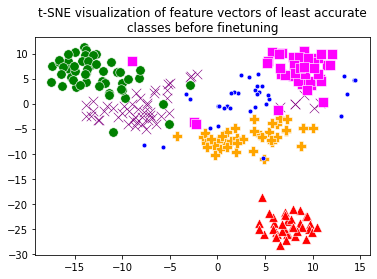

In [70]:
#t-SNE visualization of feature vectors of least accurate classes before finetuning


plt.title("\n".join(
    wrap(
        "t-SNE visualization of feature vectors of least accurate classes before finetuning",
        60)))
set_classes = list(set(selected_class_ids))
# set different markers for all the classes we are going to show
markers = ["^", ".", "s", "o", "x", "P"]
# set different colors for all the classes we are going to show
colors = ['red', 'blue', 'fuchsia', 'green', 'purple', 'orange']
class_to_marker = {}
class_to_color = {}
for index in range(len(tsne_results)):
    # assign color and marker to each type of class
    if selected_class_ids[index] not in class_to_marker:
        class_to_marker[selected_class_ids[index]] = markers.pop()
    if selected_class_ids[index] not in class_to_color:
        class_to_color[selected_class_ids[index]] = colors.pop()
    plt.scatter(tsne_results[index, 0],
                tsne_results[index, 1],
                c=class_to_color[selected_class_ids[index]],
                marker=class_to_marker[selected_class_ids[index]],
                edgecolor='white',
                linewidth='.6',
                s=90)
plt.show()




